<a href="https://colab.research.google.com/github/tanishajn12/NNDL-Labs/blob/main/coco_faster_rcnn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install pycocotools

In [2]:
import torch
from torchvision import transforms
from torch.utils.data import DataLoader
from pycocotools.coco import COCO
from PIL import Image
import os
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib.patches as patches


In [3]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")


In [4]:
!mkdir -p /content/coco
!wget http://images.cocodataset.org/zips/val2017.zip -O /content/coco/val2017.zip
!unzip -q /content/coco/val2017.zip -d /content/coco
!wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip -O /content/coco/annotations_trainval2017.zip
!unzip -q /content/coco/annotations_trainval2017.zip -d /content/coco


--2025-05-31 05:27:51--  http://images.cocodataset.org/zips/val2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 16.15.195.121, 52.216.147.35, 3.5.29.105, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|16.15.195.121|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 815585330 (778M) [application/zip]
Saving to: ‘/content/coco/val2017.zip’

/content/coco/val20 100%[===================>] 777.80M  52.9MB/s    in 15s     

2025-05-31 05:28:06 (53.1 MB/s) - ‘/content/coco/val2017.zip’ saved [815585330/815585330]

--2025-05-31 05:28:13--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 3.5.22.240, 52.216.42.177, 3.5.7.165, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|3.5.22.240|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [application/zip]
Saving to: ‘/content/coco/annotations_trainva

In [5]:
root_dir = '/content/coco/val2017'
ann_file = '/content/coco/annotations/instances_val2017.json'


In [6]:
%pwd

'/content'

In [12]:
class COCODataset(torch.utils.data.Dataset):
    def __init__(self, root, annotation, transforms=None):
        self.root = root #image directory path
        self.coco = COCO(annotation) #annotation file
        self.ids = list(sorted(self.coco.imgs.keys()))
        self.transforms = transforms

    def __getitem__(self, index):
        img_id = self.ids[index]
        ann_ids = self.coco.getAnnIds(imgIds=img_id)
        anns = self.coco.loadAnns(ann_ids)

        path = self.coco.loadImgs(img_id)[0]['file_name']
        img = Image.open(os.path.join(self.root, path)).convert("RGB")

        boxes = []
        labels = []
        areas = []
        iscrowd = []
        for ann in anns:
            xmin, ymin, width, height = ann['bbox']
            boxes.append([xmin, ymin, xmin + width, ymin + height]) #convert (x,y,width, height) -> (xmin, ymin, xmax, ymax)
            labels.append(ann['category_id'])
            areas.append(ann['area'])
            iscrowd.append(ann['iscrowd'])

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)
        areas = torch.as_tensor(areas, dtype=torch.float32)
        iscrowd = torch.as_tensor(iscrowd, dtype=torch.int64)

        # Ensure boxes tensor is of shape [N, 4], even if N is 0
        if boxes.numel() == 0: # Check if the tensor is empty
            boxes = torch.empty((0, 4), dtype=torch.float32)
        target = {
            'boxes': boxes,
            'labels': labels,
            'image_id': torch.tensor([img_id]),
            'area': areas,
            'iscrowd': iscrowd
        }

        if self.transforms:
            img = self.transforms(img)

        return img, target

    def __len__(self):
        return len(self.ids)


In [16]:
class COCODataset(torch.utils.data.Dataset):
    def __init__(self, root, annotation, transforms=None):
        self.root = root #image directory path
        self.coco = COCO(annotation) #annotation file
        self.ids = list(sorted(self.coco.imgs.keys()))
        self.transforms = transforms

    def __getitem__(self, index):
        img_id = self.ids[index]
        ann_ids = self.coco.getAnnIds(imgIds=img_id)
        anns = self.coco.loadAnns(ann_ids)

        path = self.coco.loadImgs(img_id)[0]['file_name']
        img = Image.open(os.path.join(self.root, path)).convert("RGB")

        boxes = []
        labels = []
        areas = []
        iscrowd = []
        for ann in anns:
            xmin, ymin, width, height = ann['bbox']
            boxes.append([xmin, ymin, xmin + width, ymin + height]) #convert (x,y,width, height) -> (xmin, ymin, xmax, ymax)
            labels.append(ann['category_id'])
            areas.append(ann['area'])
            iscrowd.append(ann['iscrowd'])

        # --- Modified section ---
        if len(boxes) == 0:
            # If there are no annotations, create empty tensors with the correct shape
            boxes = torch.empty((0, 4), dtype=torch.float32)
            labels = torch.empty((0,), dtype=torch.int64)
            areas = torch.empty((0,), dtype=torch.float32)
            iscrowd = torch.empty((0,), dtype=torch.int64)
        else:
            # Otherwise, convert the lists to tensors
            boxes = torch.as_tensor(boxes, dtype=torch.float32)
            labels = torch.as_tensor(labels, dtype=torch.int64)
            areas = torch.as_tensor(areas, dtype=torch.float32)
            iscrowd = torch.as_tensor(iscrowd, dtype=torch.int64)
        # --- End of modified section ---

        target = {
            'boxes': boxes,
            'labels': labels,
            'image_id': torch.tensor([img_id]),
            'area': areas,
            'iscrowd': iscrowd
        }

        if self.transforms:
            img = self.transforms(img)

        return img, target

    def __len__(self):
        return len(self.ids)

In [17]:
transform = transforms.Compose([transforms.ToTensor()])
val_dataset = COCODataset(root=root_dir, annotation=ann_file, transforms=transform)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))


loading annotations into memory...
Done (t=0.74s)
creating index...
index created!


In [18]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

# Load a model pre-trained on COCO
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights="DEFAULT")

# Get the number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features

# Replace the pre-trained head with a new one (note: +1 for background)
num_classes = 91  # COCO has 80 classes + 1 background
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

model.to(device)


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [19]:
import torch.optim as optim

params = [p for p in model.parameters() if p.requires_grad]
optimizer = optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
lr_scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)


In [22]:
from torch.utils.data import Subset

# Original dataset
val_dataset = COCODataset(root=root_dir, annotation=ann_file, transforms=transform)


indices = list(range(100))  # First 100 images
val_subset = Subset(val_dataset, indices)

val_loader = DataLoader(val_subset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))


loading annotations into memory...
Done (t=0.73s)
creating index...
index created!


In [23]:
num_epochs = 10

for epoch in range(num_epochs):
    model.train()
    i = 0
    for images, targets in val_loader:
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        i += 1
        if i % 10 == 0:
            print(f"Epoch: {epoch}, Iteration: {i}, Loss: {losses.item()}")

    lr_scheduler.step()


Epoch: 0, Iteration: 10, Loss: 0.5400694608688354
Epoch: 0, Iteration: 20, Loss: 0.7576550245285034
Epoch: 1, Iteration: 10, Loss: 0.44938328862190247
Epoch: 1, Iteration: 20, Loss: 0.6276198029518127
Epoch: 2, Iteration: 10, Loss: 0.3745235800743103
Epoch: 2, Iteration: 20, Loss: 0.5827839374542236
Epoch: 3, Iteration: 10, Loss: 0.34379464387893677
Epoch: 3, Iteration: 20, Loss: 0.4340258836746216
Epoch: 4, Iteration: 10, Loss: 0.29689961671829224
Epoch: 4, Iteration: 20, Loss: 0.41686108708381653
Epoch: 5, Iteration: 10, Loss: 0.28149574995040894
Epoch: 5, Iteration: 20, Loss: 0.39673712849617004
Epoch: 6, Iteration: 10, Loss: 0.2752656042575836
Epoch: 6, Iteration: 20, Loss: 0.36843058466911316
Epoch: 7, Iteration: 10, Loss: 0.26846736669540405
Epoch: 7, Iteration: 20, Loss: 0.3703279495239258
Epoch: 8, Iteration: 10, Loss: 0.2589333653450012
Epoch: 8, Iteration: 20, Loss: 0.3732578158378601
Epoch: 9, Iteration: 10, Loss: 0.26479828357696533
Epoch: 9, Iteration: 20, Loss: 0.36572679

In [24]:
from pycocotools.cocoeval import COCOeval
import json

model.eval()
coco_gt = val_dataset.coco
coco_results = []

for images, targets in tqdm(val_loader):
    images = [img.to(device) for img in images]
    with torch.no_grad():
        outputs = model(images)

    for i, output in enumerate(outputs):
        image_id = targets[i]['image_id'].item()
        boxes = output['boxes'].cpu().numpy()
        scores = output['scores'].cpu().numpy()
        labels = output['labels'].cpu().numpy()

        boxes[:, 2:] -= boxes[:, :2]  # Convert to x,y,w,h

        for box, score, label in zip(boxes, scores, labels):
            coco_results.append({
                'image_id': image_id,
                'category_id': int(label),
                'bbox': [float(b) for b in box],
                'score': float(score)
            })

# Save results
with open('coco_results.json', 'w') as f:
    json.dump(coco_results, f)

# Load results and evaluate
coco_dt = coco_gt.loadRes('coco_results.json')
coco_eval = COCOeval(coco_gt, coco_dt, iouType='bbox')
coco_eval.evaluate()
coco_eval.accumulate()
coco_eval.summarize()


100%|██████████| 25/25 [00:15<00:00,  1.64it/s]


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=8.55s).
Accumulating evaluation results...
DONE (t=1.26s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.014
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.020
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.017
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.010
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.014
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.017
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.008
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.012
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.012
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=10

In [25]:
def visualize_prediction(img_path, prediction):
    img = Image.open(img_path).convert("RGB")
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    ax = plt.gca()

    boxes = prediction['boxes'].cpu().numpy()
    scores = prediction['scores'].cpu().numpy()
    labels = prediction['labels'].cpu().numpy()

    for box, score, label in zip(boxes, scores, labels):
        if score > 0.5:
            xmin, ymin, xmax, ymax = box
            rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                     linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            ax.text(xmin, ymin, f'{label}:{score:.2f}', color='white',
                    backgroundcolor='red', fontsize=10)
    plt.axis('off')
    plt.show()


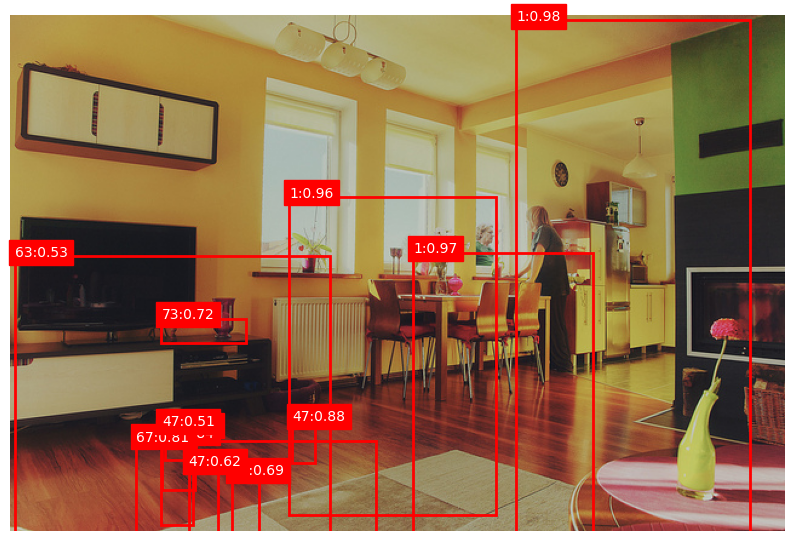

In [26]:
sample_img, _ = val_dataset[104]
sample_img_path = os.path.join(root_dir, val_dataset.coco.loadImgs(val_dataset.ids[0])[0]['file_name'])
sample_img = sample_img.to(device).unsqueeze(0)
with torch.no_grad():
    prediction = model(sample_img)[0]

visualize_prediction(sample_img_path, prediction)


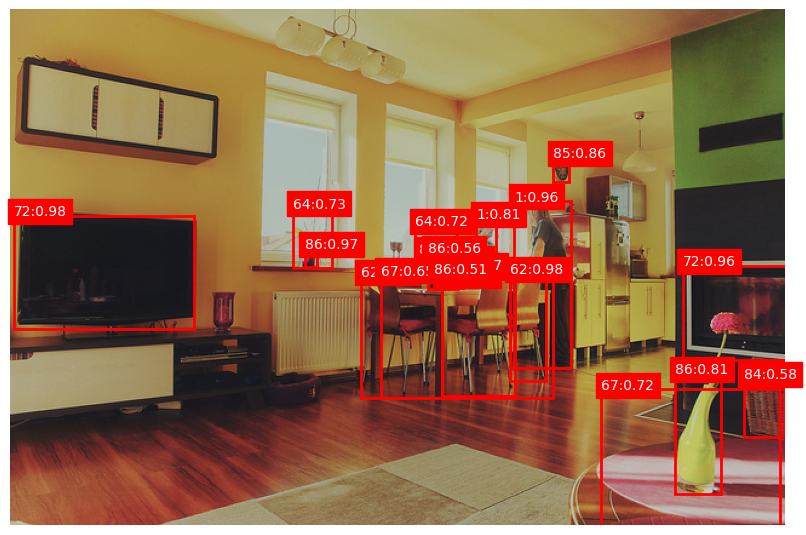

In [31]:
sample_img, _ = val_dataset[0]
sample_img_path = os.path.join(root_dir, val_dataset.coco.loadImgs(val_dataset.ids[0])[0]['file_name'])
sample_img = sample_img.to(device).unsqueeze(0)
with torch.no_grad():
    prediction = model(sample_img)[0]

visualize_prediction(sample_img_path, prediction)


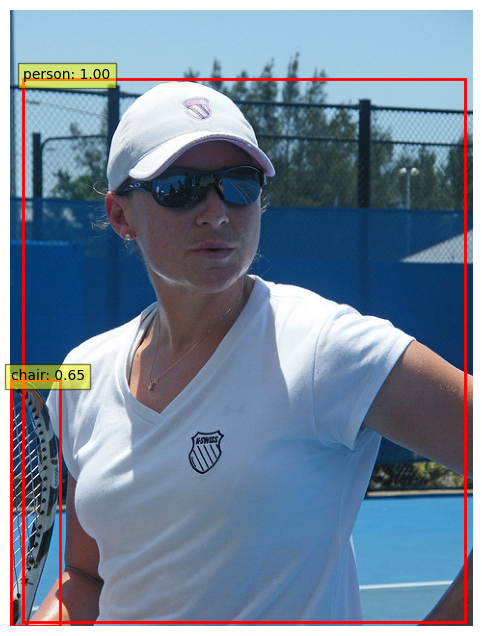

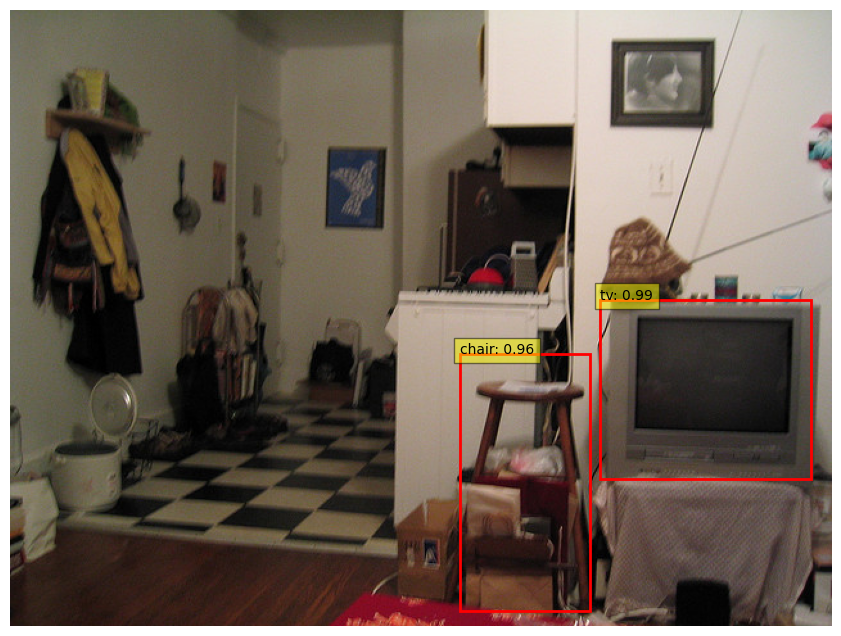

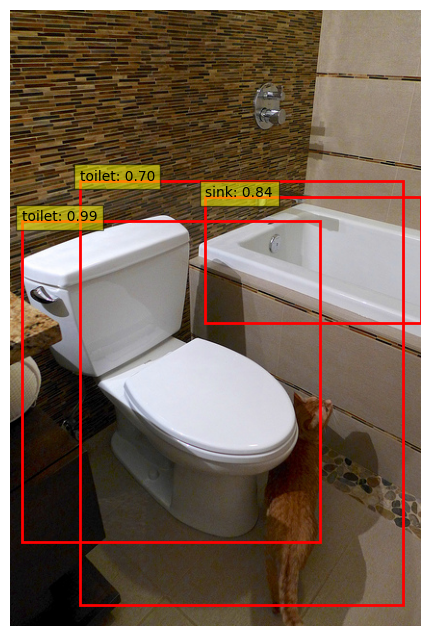

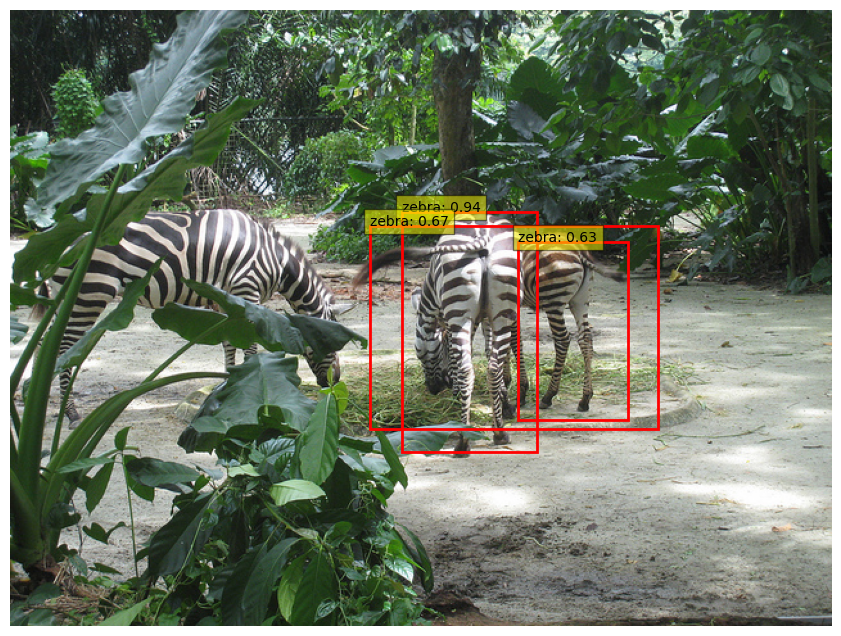

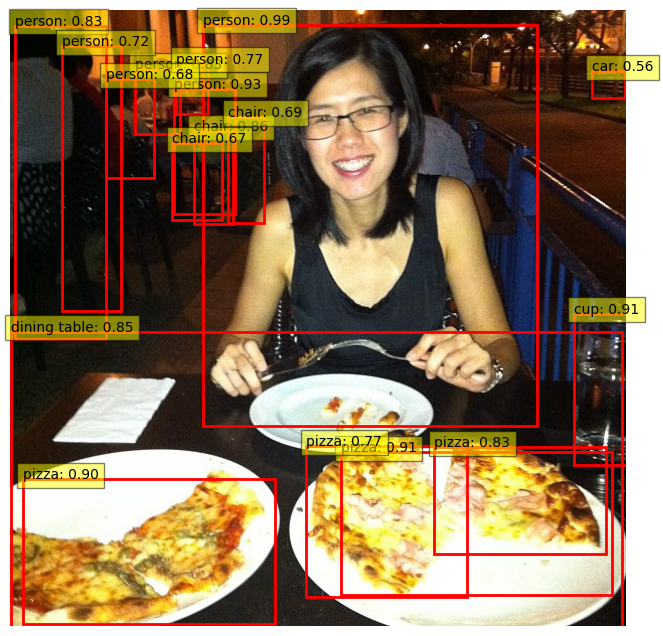

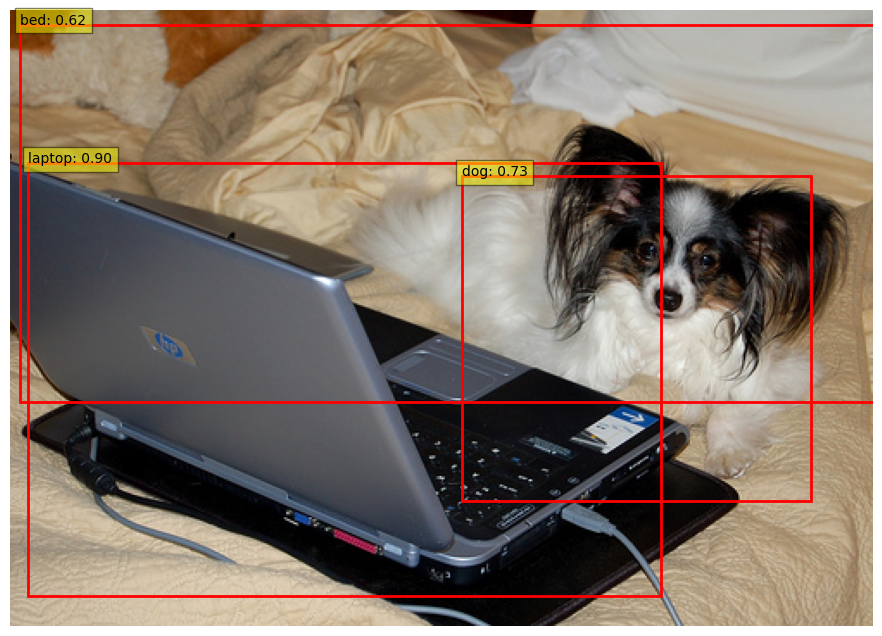

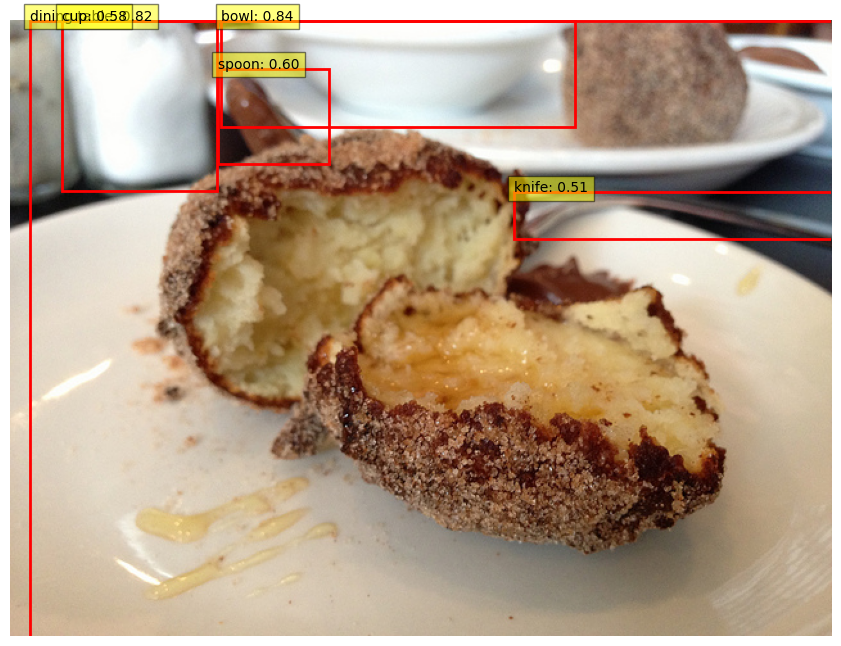

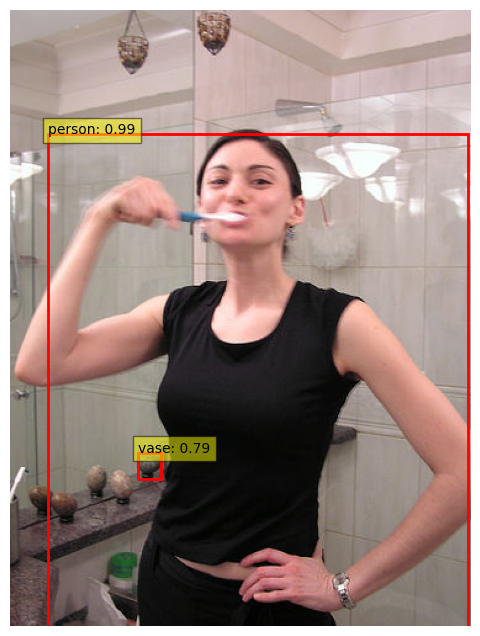

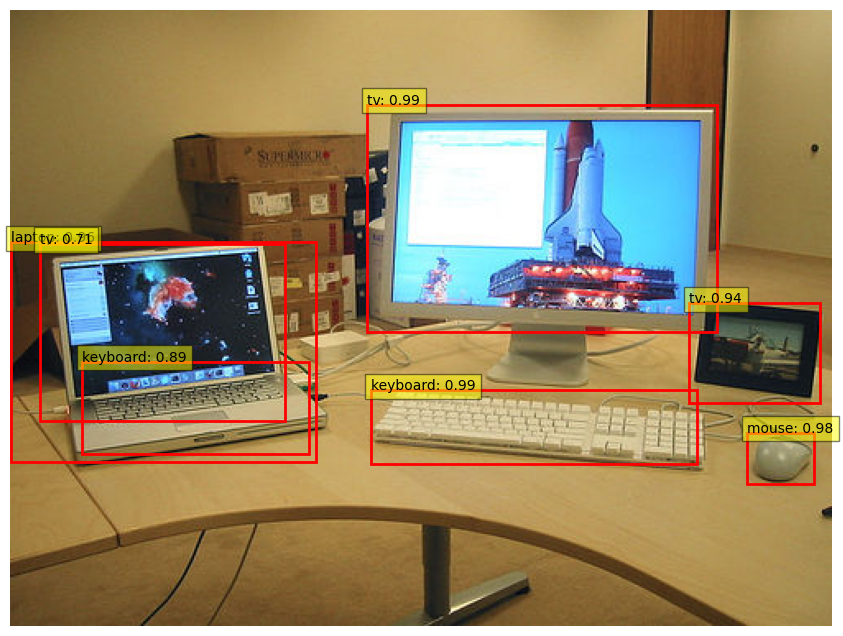

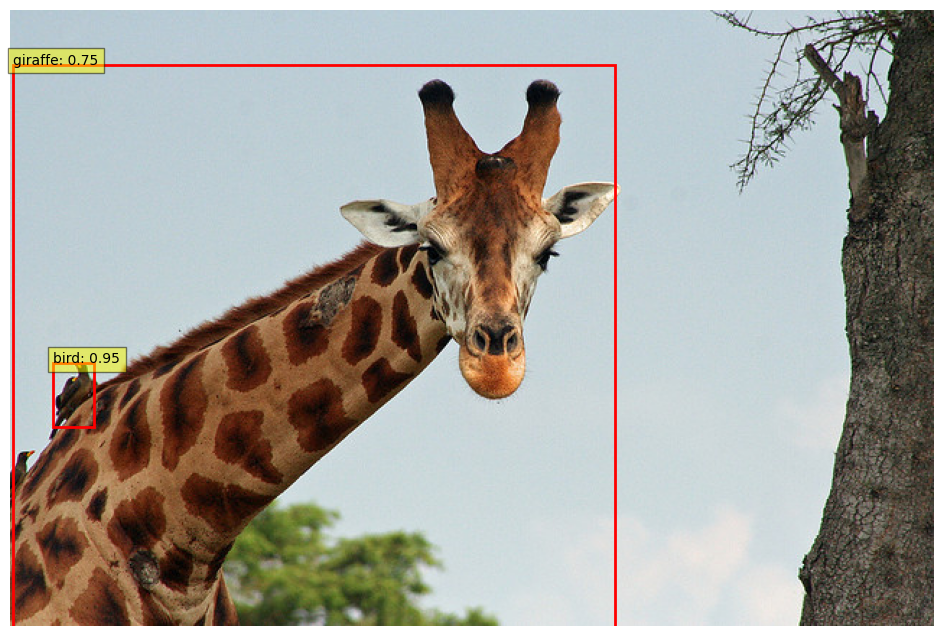

In [33]:
import random
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torchvision.transforms.functional as F
import torch
import os

def visualize_prediction(image_path, prediction, coco):
    # Load original image
    image = Image.open(image_path).convert("RGB")
    plt.figure(figsize=(12, 8))
    plt.imshow(image)
    ax = plt.gca()

    boxes = prediction['boxes'].cpu().numpy()
    scores = prediction['scores'].cpu().numpy()
    labels = prediction['labels'].cpu().numpy()

    # Filter: Show boxes with high confidence
    threshold = 0.5
    for box, score, label in zip(boxes, scores, labels):
        if score < threshold:
            continue

        # Check if the category ID is valid in the COCO dataset
        coco_categories = coco.loadCats(int(label))
        if coco_categories: # Check if loadCats returned a non-empty list
            class_name = coco_categories[0]['name']
        else:
            # Skip this prediction if the category ID is not found
            print(f"Warning: Skipping prediction with unknown category ID: {label}")
            continue


        xmin, ymin, xmax, ymax = box
        width, height = xmax - xmin, ymax - ymin
        rect = patches.Rectangle((xmin, ymin), width, height, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        ax.text(xmin, ymin, f'{class_name}: {score:.2f}', bbox=dict(facecolor='yellow', alpha=0.5))

    plt.axis('off')
    plt.show()

# Step 1: Randomly pick 10 indices
num_samples = 10
random_indices = random.sample(range(len(val_dataset)), num_samples)

# Step 2: Evaluate and visualize predictions
model.eval()
with torch.no_grad():
    for idx in random_indices:
        sample_img, _ = val_dataset[idx]
        sample_img_path = os.path.join(root_dir, val_dataset.coco.loadImgs(val_dataset.ids[idx])[0]['file_name'])
        sample_img_input = sample_img.to(device).unsqueeze(0)

        prediction = model(sample_img_input)[0]

        # Visualize prediction
        visualize_prediction(sample_img_path, prediction, val_dataset.coco)

Epoch [1/10] Average Loss: 0.3417
Epoch [2/10] Average Loss: 0.3429
Epoch [3/10] Average Loss: 0.3413
Epoch [4/10] Average Loss: 0.3404
Epoch [5/10] Average Loss: 0.3434
Epoch [6/10] Average Loss: 0.3462
Epoch [7/10] Average Loss: 0.3407
Epoch [8/10] Average Loss: 0.3432
Epoch [9/10] Average Loss: 0.3395
Epoch [10/10] Average Loss: 0.3422


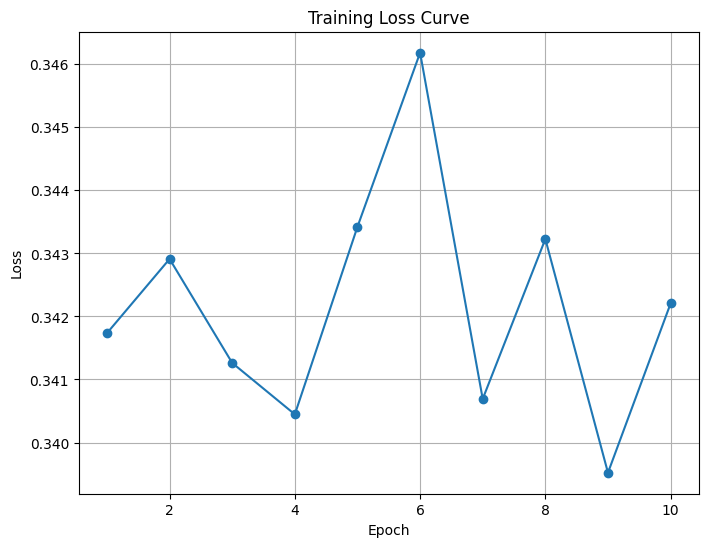

In [34]:
num_epochs = 10
train_losses = []

for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0
    num_batches = 0

    for images, targets in val_loader:
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        epoch_loss += losses.item()
        num_batches += 1

    avg_loss = epoch_loss / num_batches
    train_losses.append(avg_loss)
    print(f"Epoch [{epoch+1}/{num_epochs}] Average Loss: {avg_loss:.4f}")

    lr_scheduler.step()

# Plot Loss Curve
plt.figure(figsize=(8, 6))
plt.plot(range(1, num_epochs+1), train_losses, marker='o')
plt.title("Training Loss Curve")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid()
plt.show()
